The NFL is a multi-billion-dollar business. There are millions of fans around the world, possibly even yourself, that invest a significant amount of time and resources to follow and watch their favorite teams and players. The teams are always working to fulfill their duty to the fans. With the money they receive, they work on providing fans with the best experience possible, whether that's through giving them a great experience at the game with stadium renovations or through building a winning team that makes fans want to tune in more. Every year, teams get around 225 million dollars to spend on players, with the money being paid through contracts. It's straightforward, teams spend money on players that they think will benefit the team, and all is good, right? 

Obviously, the answer is no, and there are many nuances and subtleties that determine how much to pay players. Our project aims to identify the key performance statistics that correlate with player salaries and predict the value a player should add to a team. Time and time again teams fail by giving too much money to players who do not contribute as much as they are paid, as well as missing the opportunity on a player who ends up being a bargain. 

# Remove here
Then there is the question of how we weigh which positions are worth more money. Each position has vastly different roles on a team, and therefore some are paid better than others. This, however, also depends on the scheme the team has as that can affect how much they value each position. There are many more factors such as age and past performance that must be accounted for. Then after all of that, even if done perfectly to the book, teams can still end up not working. A player could not be a hard worker or lazy or had a fluke year, all of which are nearly impossible to predict. 
# Remove here in order to be more consise

# Attach source link
What are the factors you can account for? This is the question we will answer today, by looking through both basic box score predictions as well as the grading system from ProFootballFocus, which breaks down the tape for every play of every player. This brings an element of context to the stats, which may not be clear based on what happens in a play. For example a quarterback can throw a perfect pass that is considered an incompletion because it gets dropped by a teammate. 
# Remove and replace
We will do analysis on all different types of stats, advanced and basic, to determine which ones correlate with salary the best or how much each one correlates. This will give us a better picture of how we can predict what teams should pay a player based on their past performance and how much value in general they should add to a team. We will break down each category individually, by passing, rushing, receiving, blocking, run defense, pass rush and coverage, which will give us a nice split of positions and will allow us to differentiate the value of certain skills. 
# replace with ->
The analysis will consist of determining which stats, basic or advanced, most correlate with salary and by how much. We are dividing players into groups to better determine their groups' most important features. The below tables and graphs can be reproduced across positions, but we will be showing those that fall into our "passing" group for simplicity's sake. We propose the hypothesis that what a player should be paid can be tied to performance statistics based on performances prior to a new contract as well as identifying the key features for each position.

In [1]:
import pandas as pd
import numpy as np
import warnings

# filter out warnings
warnings.filterwarnings('ignore')

# get salary data 
tables = pd.read_html('https://www.spotrac.com/nfl/contracts/sort-value/limit-2000/', flavor='html5lib')

First, we must collect data, to do this we used the python library Pandas to read the html. Since the website we are collecting from stores the data we're looking for in a table tag we can easily grab it and store it in a dataframe. This website contains information for players salary including when they signed, total value, average annual value (AAV), and information relating to guaranteed salary.

In [24]:
import re

salary_df = tables[0].rename(columns={'Player': 'player'})
players = salary_df['player']
pl = []
start_years = []
end_years = []

for player in players:
    try:
        # split up player column and extract start year end year and name
        groups = re.search(r'(.*)  .* \| (\d{4})-(\d{4}) \(FA: (\d{4})\)', player)
        pl.append(groups.groups()[0])
        start_years.append(groups.groups()[1])
        end_years.append(groups.groups()[2])
    # if regex fails dont throw error
    except:
        pl.append(None)
        start_years.append(None)
        end_years.append(None)

# insert clean data
salary_df['player'] = pl
salary_df['start_year'] = start_years
salary_df['end_year'] = end_years

# turn salaries totals into ints
def convert_to_int(v):
    try: return int(v.replace('$', '').replace(',',''))
    except: return 0


salary_df['Value'] = salary_df['Value'].apply(convert_to_int)
salary_df['AAV'] = salary_df['AAV'].apply(convert_to_int)
salary_df['Sign Bonus'] = salary_df['Sign Bonus'].apply(convert_to_int)
salary_df["G'teed @ Sign"] = salary_df["G'teed @ Sign"].apply(convert_to_int)
salary_df["Practical G'teed"] = salary_df["Practical G'teed"].apply(convert_to_int)
salary_df['start_year'] = salary_df['start_year'].apply(convert_to_int)
salary_df['end_year'] = salary_df['end_year'].apply(convert_to_int)
salary_df.fillna(0)
salary_df.head(1)

,Rank,player,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,1,Patrick Mahomes,24,10,450000000,45000000,10000000,63081905,141481905,2020,2031


Now we need to get the player stats. Do do this we extracted csv files from pff.com which contain many useful statistics for each position. Again we are going to store this in a pandas dataframe to be consistent, since we will use all the datasets together. We also need to clean the data. We do this by melting the data and removing any years in which very minimal snaps were played and to only include positions we want. We want to differentiate the years because of how important it is to account for. A player having a good season 5 years ago is not nearly the same as them playing well in the last season.

In [25]:
# passing players and stats

passing_dfs = []

# passing

# 2022
passing_dfs.append(pd.read_csv('./passing/passing_summary.csv'))
passing_dfs[0]['year'] = 2022

# 2021
passing_dfs.append(pd.read_csv('./passing/passing_summary (1).csv'))
passing_dfs[1]['year'] = 2021

# 2020
passing_dfs.append(pd.read_csv('./passing/passing_summary (2).csv'))
passing_dfs[2]['year'] = 2020

# 2019
passing_dfs.append(pd.read_csv('./passing/passing_summary (3).csv'))
passing_dfs[3]['year'] = 2019

# 2018
passing_dfs.append(pd.read_csv('./passing/passing_summary (4).csv'))
passing_dfs[4]['year'] = 2018


# 2017
passing_dfs.append(pd.read_csv('./passing/passing_summary (5).csv'))
passing_dfs[5]['year'] = 2017

# create dataframe
passing_df = pd.concat(passing_dfs)

# remove outliers
passing_df = passing_df[passing_df['position'] == 'QB']
passing_df = passing_df[passing_df['attempts'] > 100]

# merge players with salary
passing_df = pd.merge(passing_df, salary_df, on='player')
passing_df.head(1)

,player,player_id,position,team_name,player_game_count,accuracy_percent,aimed_passes,attempts,avg_depth_of_target,avg_time_to_throw,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Patrick Mahomes,11765,QB,KC,20,78.0,685,747,7.5,2.85,...,1,24,10,450000000,45000000,10000000,63081905,141481905,2020,2031


Here are the rushing stats, we will limit these to just running backs.

In [26]:
# rushing players and stats

rushing_dfs = []

# rushing

# 2022
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary.csv'))
rushing_dfs[0]['year'] = 2022

# 2021
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (1).csv'))
rushing_dfs[1]['year'] = 2021

# 2020
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (2).csv'))
rushing_dfs[2]['year'] = 2020

# 2019
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (3).csv'))
rushing_dfs[3]['year'] = 2019

# 2018
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (4).csv'))
rushing_dfs[4]['year'] = 2018


# 2017
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (5).csv'))
rushing_dfs[5]['year'] = 2017

# create dataframe
rushing_df = pd.concat(rushing_dfs)

# remove outliers
rushing_df = rushing_df[rushing_df['position'] == 'HB']
rushing_df = rushing_df[rushing_df['attempts'] > 50]

# merge players with salary
rushing_df = pd.merge(rushing_df, salary_df, on='player')
# rushing_df

Here are receiving stats. These are a little more complicated since these will contain primary statistics for tight ends and wide receivers. We will use the data from these files for two seperate dataframes one for the wide receivers and one for the tight ends.

In [27]:
# receiving players and stats

receiving_dfs = []

# receiving

# 2022
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary.csv'))
receiving_dfs[0]['year'] = 2022

# 2021
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (1).csv'))
receiving_dfs[1]['year'] = 2021

# 2020
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (2).csv'))
receiving_dfs[2]['year'] = 2020

# 2019
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (3).csv'))
receiving_dfs[3]['year'] = 2019

# 2018
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (4).csv'))
receiving_dfs[4]['year'] = 2018


# 2017
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (5).csv'))
receiving_dfs[5]['year'] = 2017

# create dataframe
receiving_df = pd.concat(receiving_dfs)

# remove outliers
receiving_df = receiving_df[receiving_df['targets'] > 50]

# merge players with salary
receiving_df = pd.merge(receiving_df, salary_df, on='player')
# receiving_df

In [28]:
# get wide receiver data
wr_df = receiving_df[receiving_df['position'] == 'WR']
# wr_df
# tight end data
te_df = receiving_df[receiving_df['position'] == 'TE']
# te_df

Here are the blocking stats. These contain primary stats for offensive lineman which are typically broken down into 3 positions. Center, guard and tackle. We will create three seperate dataframes for this reason.

In [29]:
# offense_blocking players and stats

offense_blocking_dfs = []

# offense_blocking

# 2022
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking.csv'))
offense_blocking_dfs[0]['year'] = 2022

# 2021
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (1).csv'))
offense_blocking_dfs[1]['year'] = 2021

# 2020
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (2).csv'))
offense_blocking_dfs[2]['year'] = 2020

# 2019
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (3).csv'))
offense_blocking_dfs[3]['year'] = 2019

# 2018
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (4).csv'))
offense_blocking_dfs[4]['year'] = 2018


# 2017
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (5).csv'))
offense_blocking_dfs[5]['year'] = 2017

# create dataframe
offense_blocking_df = pd.concat(offense_blocking_dfs)

# remove outliers
offense_blocking_df = offense_blocking_df[offense_blocking_df['snap_counts_block'] > 100]

# merge players with salary
offense_blocking_df = pd.merge(offense_blocking_df, salary_df, on='player')
# offense_blocking_df

In [30]:
# center data
c_df = offense_blocking_df[offense_blocking_df['position'] == 'C']
# c_df
# guard data
g_df = offense_blocking_df[offense_blocking_df['position'] == 'G']
# g_df
# tackle data
t_df = offense_blocking_df[offense_blocking_df['position'] == 'T']
# t_df

On the defensive side we have to do different things with our dataframes. Instead of one category containing information for multiple positions in this case our positions contain information we want from multiple categories. For the interior defensive line and edge rushers, we want stats from our run defense and pass rushing dataframes. For linebackers, we want coverage and run defense statistics. To do this we will merge on positions and player names so that we can split our data up accordingly.

In [31]:
# run_defense players and stats

run_defense_dfs = []

# run_defense

# 2022
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary.csv'))
run_defense_dfs[0]['year'] = 2022

# 2021
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (1).csv'))
run_defense_dfs[1]['year'] = 2021

# 2020
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (2).csv'))
run_defense_dfs[2]['year'] = 2020

# 2019
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (3).csv'))
run_defense_dfs[3]['year'] = 2019

# 2018
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (4).csv'))
run_defense_dfs[4]['year'] = 2018


# 2017
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (5).csv'))
run_defense_dfs[5]['year'] = 2017

# create dataframe
run_defense_df = pd.concat(run_defense_dfs)

# remove outliers
run_defense_df = run_defense_df[run_defense_df['snap_counts_run'] > 100]

# merge players with salary
run_defense_df = pd.merge(run_defense_df, salary_df, on='player')
# run_defense_df

In [32]:
# pass_rush players and stats

pass_rush_dfs = []

# pass_rush

# 2022
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary.csv'))
pass_rush_dfs[0]['year'] = 2022

# 2021
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (1).csv'))
pass_rush_dfs[1]['year'] = 2021

# 2020
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (2).csv'))
pass_rush_dfs[2]['year'] = 2020

# 2019
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (3).csv'))
pass_rush_dfs[3]['year'] = 2019

# 2018
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (4).csv'))
pass_rush_dfs[4]['year'] = 2018


# 2017
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (5).csv'))
pass_rush_dfs[5]['year'] = 2017

# create dataframe
pass_rush_df = pd.concat(pass_rush_dfs)

# remove outliers
pass_rush_df = pass_rush_df[pass_rush_df['snap_counts_pass_rush'] > 100]

# merge players with salary
pass_rush_df = pd.merge(pass_rush_df, salary_df, on='player')
# pass_rush_df

In [33]:
# defense_coverage players and stats

defense_coverage_dfs = []

# defense_coverage

# 2022
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary.csv'))
defense_coverage_dfs[0]['year'] = 2022

# 2021
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (1).csv'))
defense_coverage_dfs[1]['year'] = 2021

# 2020
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (2).csv'))
defense_coverage_dfs[2]['year'] = 2020

# 2019
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (3).csv'))
defense_coverage_dfs[3]['year'] = 2019

# 2018
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (4).csv'))
defense_coverage_dfs[4]['year'] = 2018


# 2017
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (5).csv'))
defense_coverage_dfs[5]['year'] = 2017

# create dataframe
defense_coverage_df = pd.concat(defense_coverage_dfs)

# remove outliers
defense_coverage_df = defense_coverage_df[defense_coverage_df['snap_counts_coverage'] > 100]

# merge players with salary
defense_coverage_df = pd.merge(defense_coverage_df, salary_df, on='player')
# defense_coverage_df

In [34]:
idl_df = pd.merge(run_defense_df[run_defense_df['position'] == 'DI'], pass_rush_df[pass_rush_df['position'] == 'DI'])
# idl_df
edge_df = pd.merge(run_defense_df[run_defense_df['position'] == 'ED'], pass_rush_df[pass_rush_df['position'] == 'ED'])
# edge_df
lb_df = pd.merge(run_defense_df[run_defense_df['position'] == 'LB'], defense_coverage_df[defense_coverage_df['position'] == 'LB'])
# lb_df

For cornerbacks and safeties, we only need to worry about coverage, so we will split it the same way we did for offensive players.

In [35]:
# cornerbacks
cb_df = defense_coverage_df[defense_coverage_df['position'] == 'CB']
# cb_df
# Safeties
s_df = defense_coverage_df[defense_coverage_df['position'] == 'S']
# s_df

Now we need to explore our data and understand it. This is where we analyze the features of our dataset and start to determine which ones are more valuable for our hypothesis. To do this we will use single vector decomposition. We will import svds from the scipy linear algebra library and apply it to our data. We need to first remove any irrelevant data from our datasets such as player_id, franchise_id and team and handle any missing data. For missing data, we replaced it with the mean from that column. Since pretty much all missing data has already been dropped this will not affect the analysis here much.

In [36]:
import numpy as np
from scipy.sparse.linalg import svds

# passing_df = passing_df.fillna(passing_df.mean())
numeric_cols = passing_df.select_dtypes(include=[np.number]).columns.tolist()

passing_df[numeric_cols] = passing_df[numeric_cols].replace(-1, passing_df[numeric_cols].mean()).fillna(passing_df[numeric_cols].mean())

# Extract the matrix of numerical features you want to perform SVD on
features = passing_df.select_dtypes(include=[np.number])

features = features.drop([ 'year',
       'Signed Age', 'Yrs', 'Value', 'AAV', 'Sign Bonus', "G'teed @ Sign",
       "Practical G'teed", 'player_id', 'franchise_id', 'Rank', 'start_year', 'end_year', 'attempts', 'passing_snaps'], axis=1)

cols = len(features.columns) -1
features
# Perform SVD on the matrix
U, S, Vt = svds(features.to_numpy(), k=cols)

# Check the shape of the SVD factors
Vt[cols-1]
features.shape
covariance = np.dot(features.to_numpy().T, features.to_numpy())
covariance.shape
U, S, Vt = svds(covariance, k=cols)
print('Shape of U:', U.shape)
print('Shape of S:', S.shape)
print('Shape of Vt:', Vt.shape)


Shape of U: (35, 34)
Shape of S: (34,)
Shape of Vt: (34, 35)


These values indicate how much correlation there are between all the data. Each element in the vector represents its respective column. If the value is closer to 0 that means, there is high correlation between that feature and the dataset. Now we will find and list out the features themselves in order from most correlated to least to give us a good picture of the value for our features.

In [37]:
print(S)
print(Vt[cols-2])
print(features.columns)

[5.06624703e+00 1.89523648e+01 2.19705080e+01 2.63481339e+01
 3.07646398e+01 3.24489523e+01 4.33550555e+01 1.25412705e+02
 1.61078679e+02 1.93419705e+02 3.02746741e+02 3.92064372e+02
 4.21629745e+02 5.57145816e+02 7.67860795e+02 1.13161356e+03
 1.28714205e+03 1.83313611e+03 2.96104970e+03 3.53451655e+03
 4.14709493e+03 6.26540288e+03 6.89300069e+03 9.63333214e+03
 1.16294285e+04 1.64650289e+04 2.12853542e+04 2.90928359e+04
 4.72092636e+04 5.18613317e+04 1.51739284e+05 5.19084840e+05
 1.14620050e+06 2.20707329e+09]
[-2.36715145e-02 -3.19865921e-01 -3.07732750e-01 -3.77816376e-02
 -1.30735183e-02 -9.94417653e-03  2.20017878e-02 -1.06401698e-02
 -2.70636964e-01 -1.31956338e-01 -1.96913539e-04 -2.38174648e-01
 -3.60222842e-02 -4.77627344e-01 -2.19508666e-02 -1.50699317e-02
 -2.51943649e-01 -2.40826830e-01 -2.29458454e-01 -2.94324345e-01
 -9.29598017e-03 -1.61453720e-02 -6.99788835e-03 -1.02305566e-01
 -3.27370123e-01 -3.76809727e-02 -7.05687380e-02 -5.98731463e-02
 -4.48812887e-03 -1.32728

We want to plot our eigenvalues to get an idea of which vectors tell us the most about our data.

Text(0, 0.5, 'log(value)')

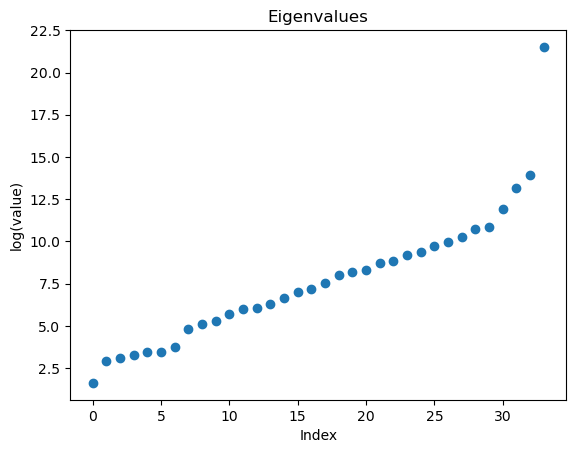

In [38]:
import matplotlib.pyplot as plt

plt.scatter([i for i in range(len(S))], np.log(S))
plt.title("Eigenvalues")
plt.xlabel("Index")
plt.ylabel('log(value)')

Now we want to sort the last vector in the Vt matrix to visualize the variability of our features. The larger values indicate stronger variability. With this we must also sort the 3 before that. As seen in the graph above the last 4 dots are growing at a much faster rate than the rest of the dots. We want to visualize those 4 vectors but we also must keep the sorting consistent so we will store all the values in vectors at the same time to not lose order of our features.

In [39]:
sorted_feature_weights1 = sorted(Vt[cols-1], reverse=True)
sorted_feature_weights2 = []
sorted_feature_weights3 = []
sorted_feature_weights4 = []
sorted_features = []
for i, w in enumerate(sorted_feature_weights1):
    fInd = np.where(Vt[cols-1] == w)[0][0]
    print(f'{i+1}: {list(features.columns)[fInd]}, {w}')
    sorted_features.append(list(features.columns)[fInd])
    sorted_feature_weights2.append(Vt[cols-2][fInd])
    sorted_feature_weights3.append(Vt[cols-3][fInd])
    sorted_feature_weights4.append(Vt[cols-4][fInd])



1: declined_penalties, -5.220334178862864e-05
2: spikes, -0.0005054548495881427
3: avg_time_to_throw, -0.0007323588300871039
4: twp_rate, -0.0008618514610766035
5: penalties, -0.001030755010926171
6: btt_rate, -0.0012012086299964296
7: hit_as_threw, -0.0014886196994451195
8: sack_percent, -0.0016162291733092331
9: drop_rate, -0.001756534705349155
10: ypa, -0.0019349219206778064
11: avg_depth_of_target, -0.0022657319615779843
12: bats, -0.002265756113445119
13: interceptions, -0.0027778255790823782
14: player_game_count, -0.0039613129787113765
15: pressure_to_sack_rate, -0.004787033310128031
16: turnover_worthy_plays, -0.004991695007488402
17: thrown_aways, -0.005808393621210023
18: drops, -0.00605512411769494
19: touchdowns, -0.00646422860953664
20: big_time_throws, -0.006610169107503574
21: scrambles, -0.007155191936091822
22: sacks, -0.00881664548060953
23: grades_hands_fumble, -0.0160025792507365
24: completion_percent, -0.01701451489935191
25: grades_run, -0.017995866032648942
26: 

Now we will put everything together in one graph. We will show a scatter diagram from each of the 4 vectors. We will display the values for each feature individually. This will give us a good idea of the variability of the features so that we can understand which ones will be useful when trying to predict salary and which ones will tell us things we already know and don't need to be trained on at the risk of overfitting.

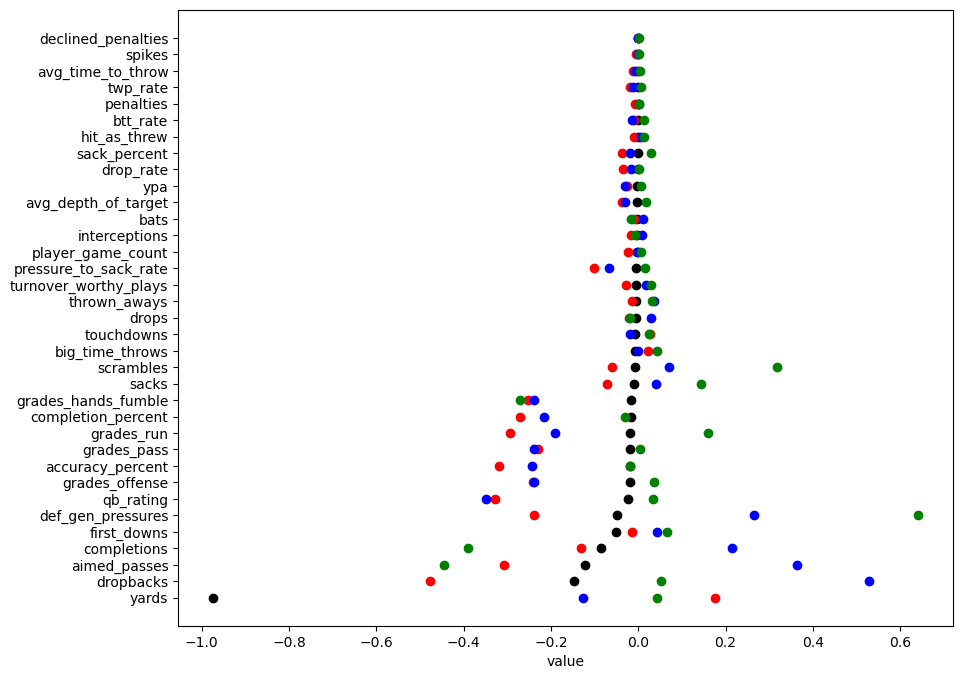

In [40]:
# scatter plot for all of the vectors
x = [i for i in range(35)]
fig, ax = plt.subplots(figsize=(10, 8))
ax.scatter(sorted_feature_weights1[::-1], x, color='black')
ax.scatter(sorted_feature_weights2[::-1], x, color='red')
ax.scatter(sorted_feature_weights3[::-1], x, color='blue')
ax.scatter(sorted_feature_weights4[::-1], x, color='green')
ax.set_yticks(range(35))
ax.set_yticklabels(sorted_features[::-1])
plt.xlabel("value")
plt.show()


Now we want to explore some of these features individually. Let's start with yards since in our principal component analysis it showed to be the feature with the most variability. Now we want to see how it correlates with our targets.

Text(0.5, 1.0, 'Yards vs AAV')

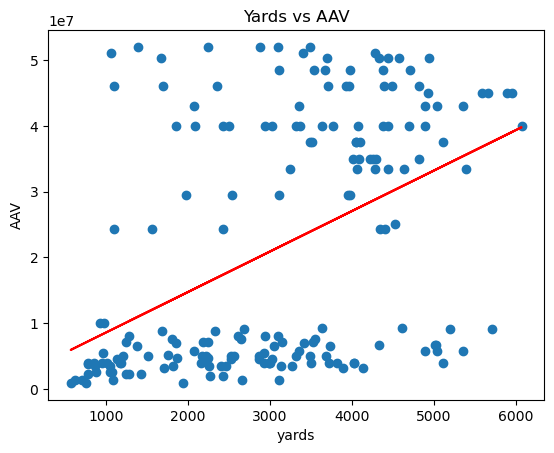

In [41]:
# yards and average salary relationship
plt.cla()
m, b = np.polyfit(passing_df['yards'], passing_df["AAV"],1)
plt.scatter( passing_df['yards'], passing_df["AAV"],)
plt.plot(passing_df['yards'], m*passing_df['yards'] + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('Yards vs AAV')

It's fairly hard to tell what is going on but we do indeed see a positive correlation between the yards and the salary, with the players earning a higher salary generally throwing for more yards than those who aren't. The next notable feature we want to see is dropbacks.

Text(0.5, 1.0, 'dropbacks vs AAV')

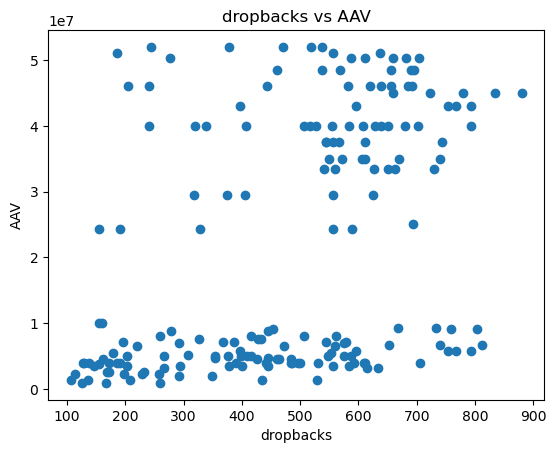

In [42]:
# AAV and dropbacks relationship
plt.cla()
plt.scatter(passing_df['dropbacks'],passing_df["AAV"])
plt.xlabel('dropbacks')
plt.ylabel('AAV')
plt.title('dropbacks vs AAV')

It looks surprisingly similar. Let's look at pff grade, which again is a grade made by analysts at pro football focus where they grade every play of the player.

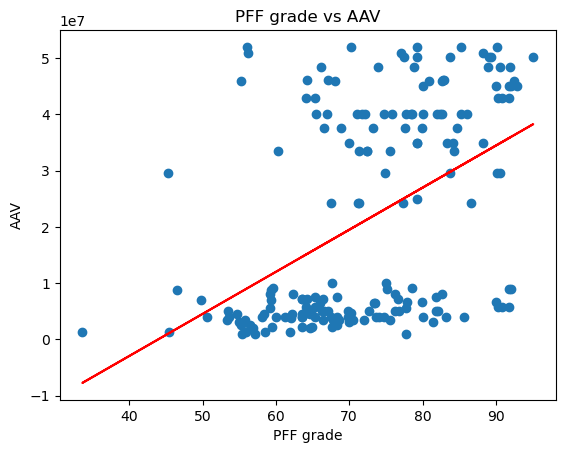

In [43]:
# AAV and pff grade relationship
plt.cla()
m, b = np.polyfit(passing_df['grades_offense'], passing_df["AAV"],1)
plt.scatter(passing_df['grades_offense'], passing_df["AAV"],)
plt.plot(passing_df['grades_offense'], m*passing_df['grades_offense'] + b, color='red')
plt.xlabel('PFF grade')
plt.ylabel('AAV')
plt.title('PFF grade vs AAV')
plt.show()

What is very noticeable between all of these graphs is the two clusters that appear in the plots. These clusters are separated by salary. The lower cluster represents the players on the rookie contracts while the upper cluster are players who have been paid second contracts, which are significantly higher. When a player is first drafted they are essentially assigned a contract that they play on for 4-5 years before being eligible for a new one. Typically, the rookie contracts are farily cheap, and if the player is good enough they either get extended or sign with another team, typically for a lot more money than they were making in the past. This is a very important thing to distinguish in our data. We will explore this further with a k means analysis which will give us a good idea of the split between our clusters.

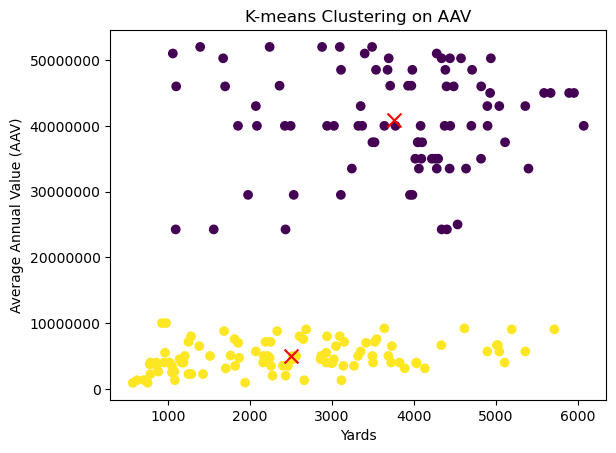

In [44]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler


# Create a dataset by stacking the features
data = passing_df[['AAV', 'yards']]

# Perform k-means clustering
kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

# Get cluster labels and centroids
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Add cluster labels to the DataFrame
passing_df["Cluster"] = labels

# Plot the scatter plot
plt.scatter(passing_df["yards"], passing_df["AAV"], c=labels, cmap='viridis')
plt.scatter(centroids[:, 1], centroids[:, 0], c='red', marker='x', s=100)

# Set labels and title
plt.ylabel('Average Annual Value (AAV)')
plt.xlabel('Yards')
plt.title('K-means Clustering on AAV')
plt.ticklabel_format(style='plain')

# Display the plot
plt.show()

We get a very clear and obvious cluster, and the data within each cluster is vastly different with the yellow cluster being more condensed and the purple cluster being a lot more spread out.

In [45]:
from sklearn.linear_model import LinearRegression

data = passing_df[["yards", "AAV", "Cluster"]]

# Split the DataFrame into clusters
cluster_0_df = passing_df[passing_df["Cluster"] == 0]
cluster_1_df = passing_df[passing_df["Cluster"] == 1]

# Perform linear regression within each cluster
linear_regression_0 = LinearRegression()
linear_regression_0.fit(cluster_0_df[["yards"]], cluster_0_df["AAV"])

linear_regression_1 = LinearRegression()
linear_regression_1.fit(cluster_1_df[["yards"]], cluster_1_df["AAV"])

# Print the coefficients for each cluster
print("Cluster 0: Yards Run Coefficient =", linear_regression_0.coef_)
print("Cluster 1: Yards Run Coefficient =", linear_regression_1.coef_)

Cluster 0: Yards Run Coefficient = [101.41286478]
Cluster 1: Yards Run Coefficient = [594.08385599]


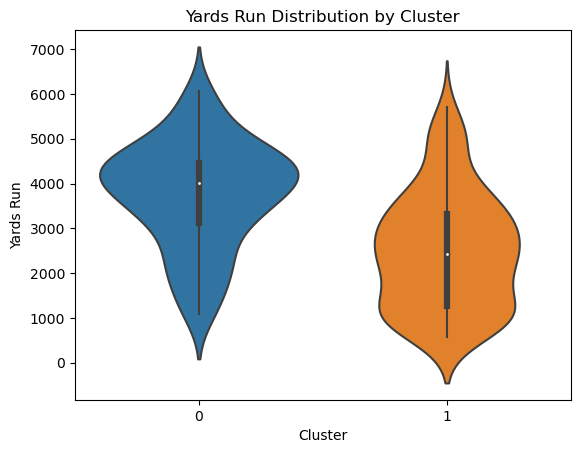

In [46]:
import seaborn as sns

# Create a violin plot
sns.violinplot(x="Cluster", y="yards", data=data)

# Set labels and title
plt.xlabel('Cluster')
plt.ylabel('Yards Run')
plt.title('Yards Run Distribution by Cluster')

plt.show()

The above violin plot shows that the above 20 million players have a much higher yards run rate than the under 20 million players. This could be explained by how often players are allowed to play. Big name players get paid more, and get more opportunities to run more yards than lower paid players.

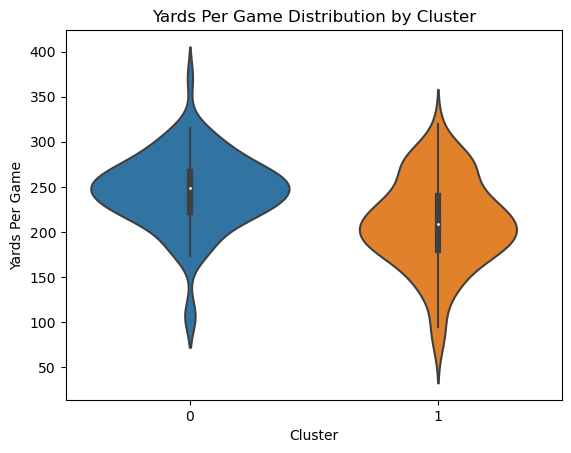

In [47]:
data = passing_df[["yards", "AAV", "Cluster", "player_game_count"]]

# Calculate yards per game
data["Yards Per Game"] = data["yards"] / data["player_game_count"]

# Create a violin plot
sns.violinplot(x="Cluster", y="Yards Per Game", data=data)

# Set labels and title
plt.xlabel('Cluster')
plt.ylabel('Yards Per Game')
plt.title('Yards Per Game Distribution by Cluster')

plt.show()

This gives us a better picture of how our clusters are distributed. In our left cluster we have more datapoints focused within one area at around 250 yards per game. Our other cluster is a tad more spread with the bulk of datapoints lying around 200 yards per game. We can clearly see there is a correlation between getting paid more and throwing for more yards. But does this mean that we can correlate well within our clusters to find more insightful discoveries? Let's explore further. First let's average out our quarterbacks stats rather than have them seperate by year in order to get a more general picture.

In [48]:
# create one row per player with their average for each feature
grouped_qbs = passing_df.groupby('player')[numeric_cols].mean()
grouped_qbs.head()


,player_id,player_game_count,accuracy_percent,aimed_passes,attempts,avg_depth_of_target,avg_time_to_throw,bats,big_time_throws,btt_rate,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
player,,,,,,,,,,,,,,,,,,,,,
Aaron Rodgers,2241.0,15.500000,76.533333,485.500000,530.5,8.416667,2.763333,3.833333,34.166667,5.85,...,11.0,38.0,3.0,150815000.0,50271667.0,40800000.0,101515000.0,150815000.0,2022.0,2024.0
Andy Dalton,6187.0,12.166667,73.333333,359.166667,389.5,8.300000,2.525000,7.833333,16.833333,3.95,...,492.0,35.0,2.0,10000000.0,5000000.0,4835000.0,8000000.0,8000000.0,2023.0,2024.0
Baker Mayfield,46518.0,14.800000,72.260000,427.800000,466.0,8.780000,2.806000,11.800000,26.200000,5.04,...,1014.0,27.0,1.0,4000000.0,4000000.0,2875000.0,4000000.0,4000000.0,2023.0,2023.0
Blaine Gabbert,6162.0,5.500000,66.050000,129.500000,136.0,8.750000,2.435000,3.500000,5.000000,3.30,...,1940.0,33.0,1.0,1317500.0,1317500.0,152500.0,1092500.0,1092500.0,2023.0,2023.0
Brian Hoyer,5277.0,8.000000,68.800000,202.000000,211.0,8.400000,2.390000,3.000000,9.000000,4.10,...,848.0,37.0,2.0,4500000.0,2250000.0,875000.0,4205000.0,4205000.0,2023.0,2024.0


Now we want to see the relationship between a players average yards and their salary.

Text(0.5, 1.0, 'Player Average Yards vs AAV')

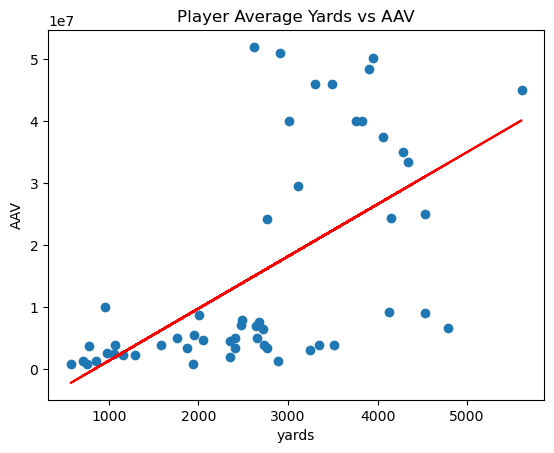

In [49]:

plt.cla()
m, b = np.polyfit(grouped_qbs['yards'],grouped_qbs['AAV'] , 1)
plt.scatter(grouped_qbs['yards'], grouped_qbs['AAV'],)
plt.plot(grouped_qbs['yards'], grouped_qbs['yards']*m + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('Player Average Yards vs AAV')

Now let's analyze our clusters. Let's start with the less than 20 million cluster.

Text(0.5, 1.0, 'Lower Cluster\nYards VS AAV')

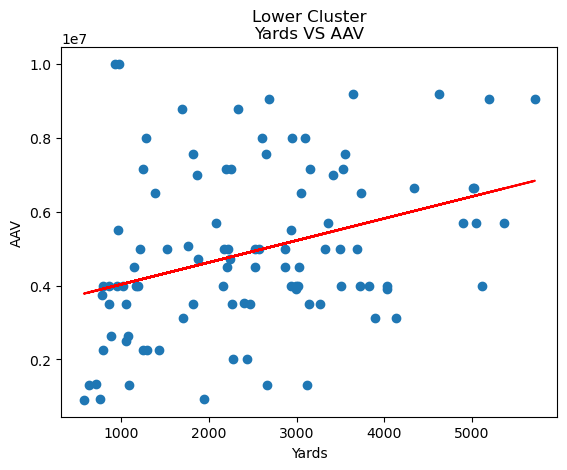

In [53]:

plt.cla()
# lower salary cluster
m, b = np.polyfit(cluster_1_df['yards'], cluster_1_df['AAV'], 1)
plt.scatter(cluster_1_df['yards'], cluster_1_df['AAV'])
plt.plot(cluster_1_df['yards'], cluster_1_df['yards']*m + b, color='red')
plt.xlabel('Yards')
plt.ylabel('AAV')
plt.title('Lower Cluster\nYards VS AAV')

More than 20 million cluster

Text(0.5, 1.0, 'Upper Cluster\nYards VS AAV')

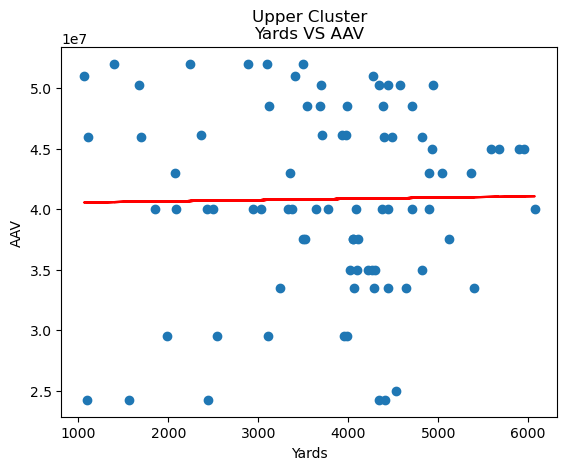

In [54]:
plt.cla()
# upper salary cluster
m, b = np.polyfit( cluster_0_df['yards'], cluster_0_df['AAV'], 1)
plt.scatter(cluster_0_df['yards'],cluster_0_df['AAV'],)
plt.plot(cluster_0_df['yards'], cluster_0_df['yards']*m + b, color='red')
plt.xlabel('Yards')
plt.ylabel('AAV')
plt.title('Upper Cluster\nYards VS AAV')

Now let's look at the relationship between players before they receive their contract.

Text(0.5, 1.0, 'Yards before Contract Year VS AAV')

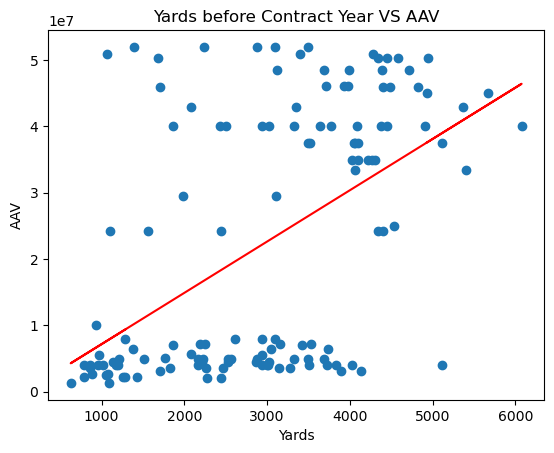

In [55]:
# yards and average salary relationship
plt.cla()
m, b = np.polyfit(passing_df[passing_df['year'] < passing_df['start_year']]['yards'], passing_df[passing_df['year'] < passing_df['start_year']]["AAV"],1)
plt.scatter(passing_df[passing_df['year'] < passing_df['start_year']]['yards'], passing_df[passing_df['year'] < passing_df['start_year']]["AAV"],)
plt.plot(passing_df[passing_df['year'] < passing_df['start_year']]['yards'], m*passing_df[passing_df['year'] < passing_df['start_year']]['yards'] + b, color='red')
plt.xlabel('Yards')
plt.ylabel('AAV')
plt.title('Yards before Contract Year VS AAV')

Now let's look at how players perform after they receive their contracts.

Text(0.5, 1.0, 'Yards after Contract Year VS AAV')

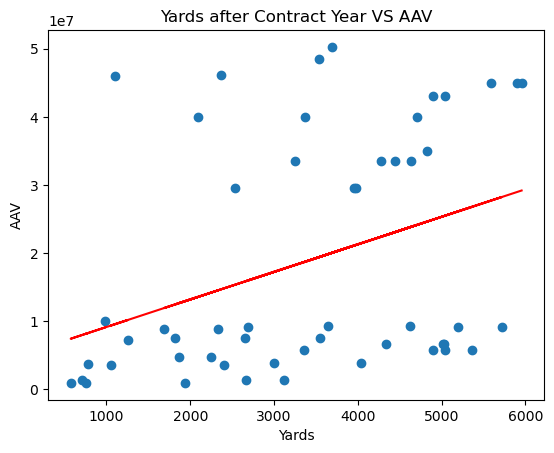

In [56]:

# yards and average salary relationship
plt.cla()
m, b = np.polyfit(passing_df[passing_df['year'] >= passing_df['start_year']]['yards'], passing_df[passing_df['year'] >= passing_df['start_year']]["AAV"],1)
plt.scatter(passing_df[passing_df['year'] >= passing_df['start_year']]['yards'], passing_df[passing_df['year'] >= passing_df['start_year']]["AAV"],)
plt.plot(passing_df[passing_df['year'] >= passing_df['start_year']]['yards'], m*passing_df[passing_df['year'] >= passing_df['start_year']]['yards'] + b, color='red')
plt.xlabel('Yards')
plt.ylabel('AAV')
plt.title('Yards after Contract Year VS AAV')

Now let's explore the upper cluster, the quarterbacks who have received a notable second contract. Understanding these players will help us use our data to figure out how to better predict what contracts should look like. 

Text(0.5, 1.0, 'Upper Cluster\nYards before Contract VS AAV')

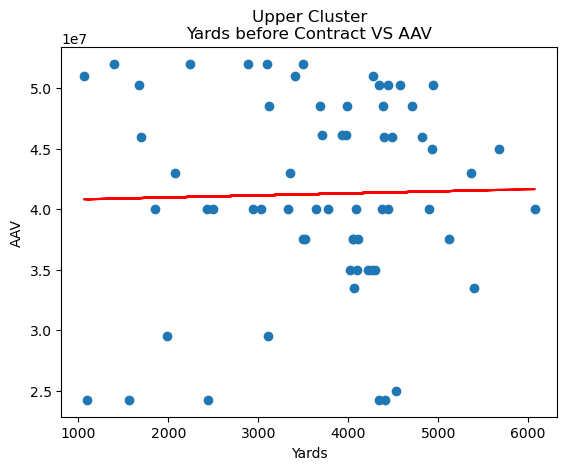

In [57]:

# yards before contract and average salary relationship
plt.cla()
m, b = np.polyfit(cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]['yards'], cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]["AAV"],1)
plt.scatter(cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]['yards'], cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]["AAV"],)
plt.plot(cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]['yards'], m*cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]['yards'] + b, color='red')
plt.xlabel('Yards')
plt.ylabel('AAV')
plt.title('Upper Cluster\nYards before Contract VS AAV')

Text(0.5, 1.0, 'Upper Cluster\nYards after Contract VS AAV')

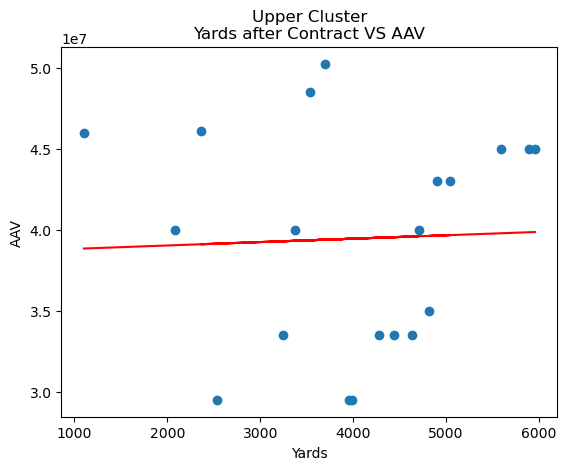

In [58]:

# yards after contract and average salary relationship
plt.cla()
m, b = np.polyfit(cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]['yards'], cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]["AAV"],1)
plt.scatter(cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]['yards'], cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]["AAV"],)
plt.plot(cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]['yards'], m*cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]['yards'] + b, color='red')
plt.xlabel('Yards')
plt.ylabel('AAV')
plt.title('Upper Cluster\nYards after Contract VS AAV')

Text(0.5, 1.0, 'Upper Cluster\nPFF Grade before Contract VS AAV')

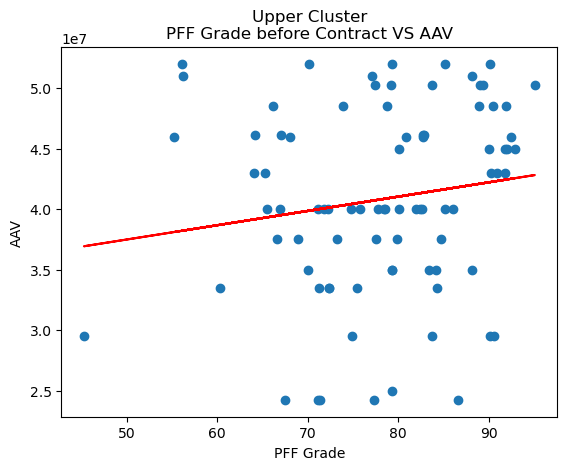

In [61]:
# pff grade and average salary relationship
plt.cla()
m, b = np.polyfit(cluster_0_df['grades_offense'], cluster_0_df["AAV"],1)
plt.scatter(cluster_0_df['grades_offense'], cluster_0_df["AAV"],)
plt.plot(cluster_0_df['grades_offense'], m*cluster_0_df['grades_offense'] + b, color='red')
plt.xlabel('PFF Grade')
plt.ylabel('AAV')
plt.title('Upper Cluster\nPFF Grade before Contract VS AAV')

Text(0.5, 1.0, 'Upper Cluster\nBig Time Throws after Contract VS AAV')

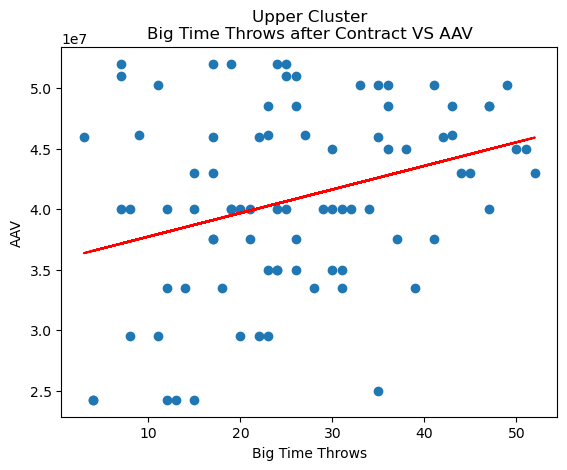

In [62]:
# big time throws and average salary relationship
plt.cla()
m, b = np.polyfit(cluster_0_df['big_time_throws'], cluster_0_df["AAV"],1)
plt.scatter(cluster_0_df['big_time_throws'], cluster_0_df["AAV"],)
plt.plot(cluster_0_df['big_time_throws'], m*cluster_0_df['big_time_throws'] + b, color='red')
plt.xlabel('Big Time Throws')
plt.ylabel('AAV')
plt.title('Upper Cluster\nBig Time Throws after Contract VS AAV')

There appears to be high correlation between salary and yards for players who are paid less. However, for players that are paid high, there is negiligeable correlation, which means that it is both not strong and not a good predictor for future salary. However, we do see slightly more promise with other features such as big time throws and pff grade. We will now further explore feature selection in order to see if we can select the features that will be able to predict salary together. We want to now figure out any features that are redundant with each other or irrelevant to predicting the salary. Understanding our data in this way will allow for cleaner built models that converge quicker, generalize, and produce more accurate results more efficiently. We will start by seeing how our features correlate with the AAV and to drop features in which there is no correlation..

In [63]:
targets = ['Value', 'AAV', 'Sign Bonus', "G'teed @ Sign", "Practical G'teed"]
# features = passing_df.select_dtypes(include=[np.number])
aav_corr = passing_df[list(features.columns) + ['AAV']].corr()['AAV']
abs(aav_corr).sort_values()

grades_hands_fumble      0.006347
declined_penalties       0.016309
sack_percent             0.052691
hit_as_threw             0.067132
pressure_to_sack_rate    0.073608
interceptions            0.093357
avg_depth_of_target      0.104274
drop_rate                0.115099
bats                     0.126030
spikes                   0.195554
grades_run               0.222153
twp_rate                 0.226182
avg_time_to_throw        0.232858
turnover_worthy_plays    0.235923
penalties                0.238186
completion_percent       0.278084
accuracy_percent         0.299559
drops                    0.313104
sacks                    0.359197
scrambles                0.361284
btt_rate                 0.381266
ypa                      0.392588
thrown_aways             0.405443
aimed_passes             0.407426
def_gen_pressures        0.423763
dropbacks                0.424293
completions              0.425303
player_game_count        0.428411
grades_pass              0.450613
yards         

The cutoff we will decide on is spikes, which based on intuition about football has very little to do with analyzing performance of a player. Everything with less correlation to AAV than that will also be dropped.

In [64]:
aav_corr = aav_corr[aav_corr > 0.21]
features = features[aav_corr.drop('AAV').index]
aav_corr

player_game_count        0.428411
accuracy_percent         0.299559
aimed_passes             0.407426
avg_time_to_throw        0.232858
big_time_throws          0.467984
btt_rate                 0.381266
completion_percent       0.278084
completions              0.425303
def_gen_pressures        0.423763
dropbacks                0.424293
drops                    0.313104
first_downs              0.457885
grades_offense           0.474365
grades_pass              0.450613
grades_run               0.222153
penalties                0.238186
qb_rating                0.491506
sacks                    0.359197
scrambles                0.361284
thrown_aways             0.405443
touchdowns               0.500041
turnover_worthy_plays    0.235923
yards                    0.456133
ypa                      0.392588
AAV                      1.000000
Name: AAV, dtype: float64

Now we have reduced our feature set a little bit. Now we want to remove features that are redundant with each other. To do this we will use the pandas scatter matrix plotting function to visualise this intuitively. What this does is that it will plot the correlation between every feature individually. With this we can see features that are highly correlated and therefore redundant with each other.

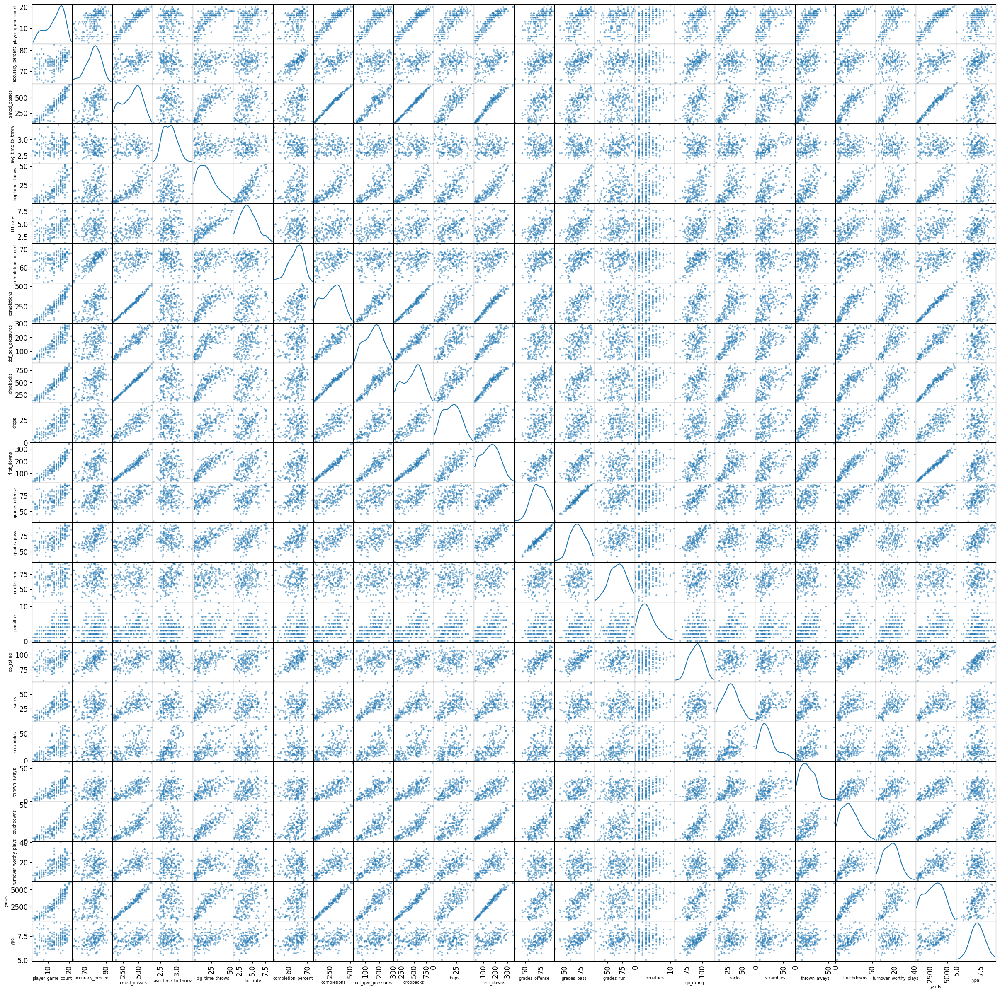

In [1057]:
pd.plotting.scatter_matrix(features[aav_corr.drop('AAV').index], diagonal='kde', figsize=(30, 30))
for ax in plt.gcf().axes:
    ax.tick_params(labelsize=12)
    ax.xaxis.label.set_fontsize(7)
    ax.yaxis.label.set_fontsize(7)
plt.show()

From this graph we can observe a few datapoints to drop. First off aimed passes is a highly redundant feature so we will drop it. Other features are similar, including completions, dropbacks, first downs, big time throws and yards. Because big time throws is the most correlated with AAV we will keep that one and drop the others. Offense and passing grades are also highly redundant as passing grade is a subset of the offensive grade, we will drop this. We can see some correlation in other areas but we will leave those for now. This leaves us with now 18 features.

In [65]:
features = features.drop(['aimed_passes', 'completions', 'dropbacks', 'first_downs', 'grades_pass', 'yards'], axis=1)
corr_matrix = features.corr()
corr_matrix

,player_game_count,accuracy_percent,avg_time_to_throw,big_time_throws,btt_rate,completion_percent,def_gen_pressures,drops,grades_offense,grades_run,penalties,qb_rating,sacks,scrambles,thrown_aways,touchdowns,turnover_worthy_plays,ypa
player_game_count,1.000000,0.429301,0.106279,0.771449,0.350963,0.356686,0.887609,0.798986,0.622563,0.280995,0.516761,0.471123,0.745610,0.573988,0.741764,0.814860,0.714925,0.343643
accuracy_percent,0.429301,1.000000,-0.236996,0.352143,0.069451,0.846772,0.354767,0.380792,0.589441,0.130464,0.174149,0.668179,0.277918,0.114632,0.337410,0.488296,0.122814,0.423530
avg_time_to_throw,0.106279,-0.236996,1.000000,0.081180,0.174864,-0.307558,0.193680,-0.021261,0.056650,0.331953,0.140061,-0.027110,0.183925,0.588670,0.208568,0.033477,0.030151,0.012928
big_time_throws,0.771449,0.352143,0.081180,1.000000,0.787809,0.343830,0.780611,0.687378,0.751245,0.289903,0.395467,0.567822,0.569003,0.519511,0.667384,0.876833,0.595736,0.450656
btt_rate,0.350963,0.069451,0.174864,0.787809,1.000000,0.144231,0.385715,0.282201,0.594728,0.234412,0.216540,0.480798,0.282273,0.334100,0.328060,0.561475,0.256329,0.456562
completion_percent,0.356686,0.846772,-0.307558,0.343830,0.144231,1.000000,0.272353,0.163420,0.551004,0.066930,0.126864,0.718756,0.235683,0.079652,0.130885,0.467056,0.105082,0.493257
def_gen_pressures,0.887609,0.354767,0.193680,0.780611,0.385715,0.272353,1.000000,0.771289,0.571424,0.300105,0.433304,0.389149,0.798406,0.667269,0.750013,0.780052,0.739820,0.268537
drops,0.798986,0.380792,-0.021261,0.687378,0.282201,0.163420,0.771289,1.000000,0.526495,0.228217,0.348376,0.269346,0.561221,0.449563,0.645606,0.691049,0.662755,0.155595
grades_offense,0.622563,0.589441,0.056650,0.751245,0.594728,0.551004,0.571424,0.526495,1.000000,0.432749,0.268649,0.738142,0.406347,0.434818,0.484112,0.755472,0.261421,0.603901
grades_run,0.280995,0.130464,0.331953,0.289903,0.234412,0.066930,0.300105,0.228217,0.432749,1.000000,0.139046,0.206942,0.248046,0.528583,0.210652,0.303622,0.200937,0.161662


In [66]:
# Shows the names of each column
features.columns

Index(['player_game_count', 'accuracy_percent', 'avg_time_to_throw',
       'big_time_throws', 'btt_rate', 'completion_percent',
       'def_gen_pressures', 'drops', 'grades_offense', 'grades_run',
       'penalties', 'qb_rating', 'sacks', 'scrambles', 'thrown_aways',
       'touchdowns', 'turnover_worthy_plays', 'ypa'],
      dtype='object')

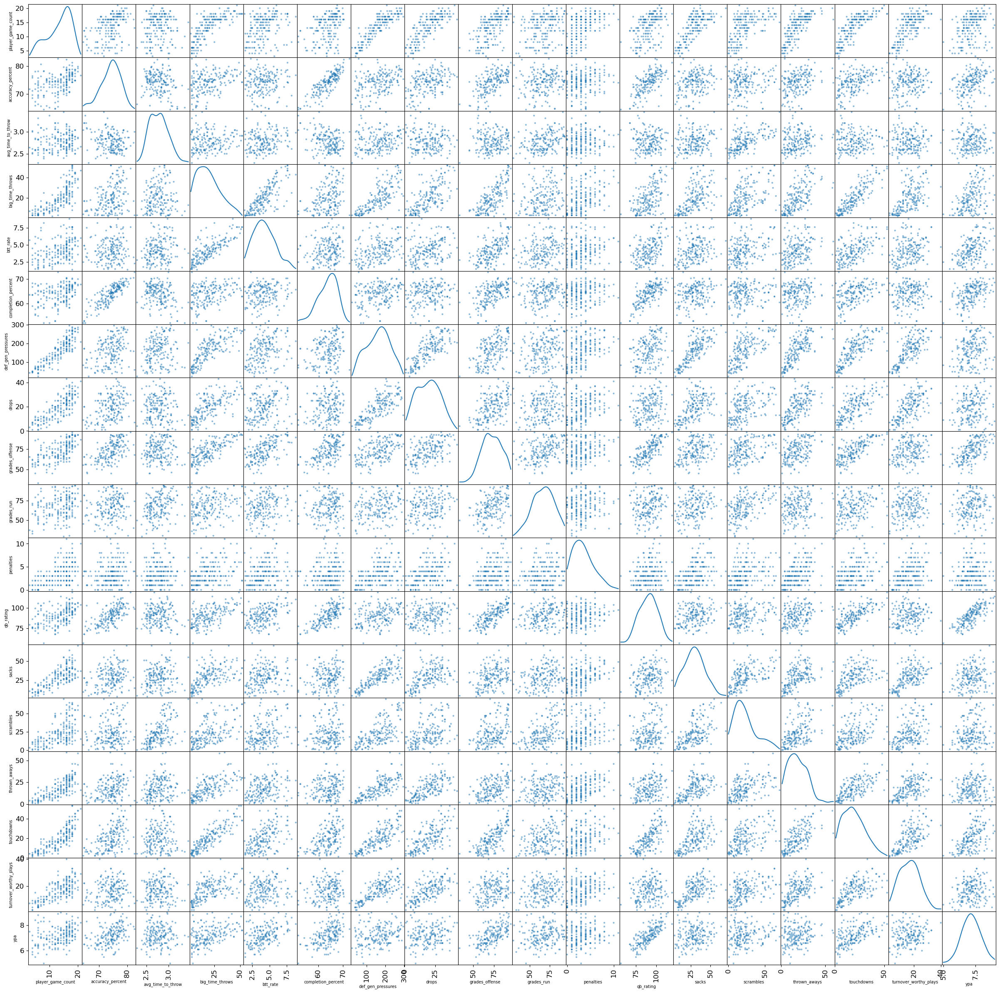

In [68]:
pd.plotting.scatter_matrix(features[corr_matrix.index], diagonal='kde', figsize=(30, 30))
for ax in plt.gcf().axes:
    ax.tick_params(labelsize=12)
    ax.xaxis.label.set_fontsize(7)
    ax.yaxis.label.set_fontsize(7)
plt.show()

Nothing seems blatantnly correlated. Now we want to test how many features are considered valuable for our dataset. For this we will do a sequential feature selection and test out how effective the number of features are on a linear regression model. 
The SequencialFeatureSelection from sklearn is a greedy algorithm which will recursively select the next best feature for the model and go up to the specified amount. We looped over all possible number of features to see if it converged early so that we could possibly remove some features.

In [70]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Create a LinearRegression model
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(features, passing_df['AAV'], test_size=0.2, random_state=42)

for i in range(1, len(features.columns)):
    # Create a SequentialFeatureSelector
    sfs = SequentialFeatureSelector(lr, n_features_to_select=i, direction='forward')
    # Fit the SequentialFeatureSelector on the data
    sfs.fit(X_train, y_train)
    # Get the selected feature indices
    selected_features = sfs.get_support(indices=True)
    selected_feature_names = list(features.columns[selected_features])
    lr.fit(X_train[selected_feature_names], y_train)
    r_squared = lr.score(X_test[selected_feature_names], y_test)
    print(f'{i} features, R-squared: {r_squared}')  


1 features, R-squared: 0.21118748880528926
2 features, R-squared: 0.2576296414643814
3 features, R-squared: 0.28466466108365085
4 features, R-squared: 0.278937122155114
5 features, R-squared: 0.2648844912743322
6 features, R-squared: 0.27987384913026847
7 features, R-squared: 0.25193832762101576
8 features, R-squared: 0.24663356458398034
9 features, R-squared: 0.24685734264820847
10 features, R-squared: 0.24478652071674945
11 features, R-squared: 0.20626569348354695
12 features, R-squared: 0.21099909348091905
13 features, R-squared: 0.19181530727627805
14 features, R-squared: 0.19287745802737144
15 features, R-squared: 0.19177761918834646
16 features, R-squared: 0.1917619335448274
17 features, R-squared: 0.17032698915731814


There is a big jump from 15 to 16 features but there is not as big of one from 16 to 17, so we will move forward with the top 16 features.

In [1062]:
sfs = SequentialFeatureSelector(lr, n_features_to_select=16, direction='forward')
sfs.fit(X_train, y_train)
# Get the selected feature indices
selected_features = sfs.get_support(indices=True)
selected_feature_names = list(features.columns[selected_features]) + ['start_year']
features = passing_df[selected_feature_names]
features.columns

Index(['player_game_count', 'accuracy_percent', 'avg_time_to_throw',
       'big_time_throws', 'btt_rate', 'completion_percent', 'drops',
       'grades_offense', 'grades_run', 'penalties', 'qb_rating', 'sacks',
       'scrambles', 'thrown_aways', 'turnover_worthy_plays', 'ypa',
       'start_year'],
      dtype='object')

Now we will do some machine learning to create a model that can predict salary. We will use some of the observations we used from our exploration analysis to experiment with multiple models. For the most part, we will be using neural networks. We will be using tensorflow, a python library that creates neural networks and performs calculations into a model. It allows us to specify how many hidden layers and nodes we have. The finer details are handeled on the back end like the weight adjustments, which will determine how we get from input to output. For our model, we will use 1 output since our targets are already closely correlated. We will use relu activation function which will not allow us to have negative values and we will normalize all our data. We will train on 80% of our data and hold out 20% for testing. We will have 2 hidden layers.

In [73]:
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from sklearn.metrics import r2_score

# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, passing_df[['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [74]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [75]:
from sklearn.metrics import r2_score
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

2/2 [==============================] - 0s 2ms/step
R^2 score: -0.03234123713280557


Text(0, 0.5, 'Predicted Data')

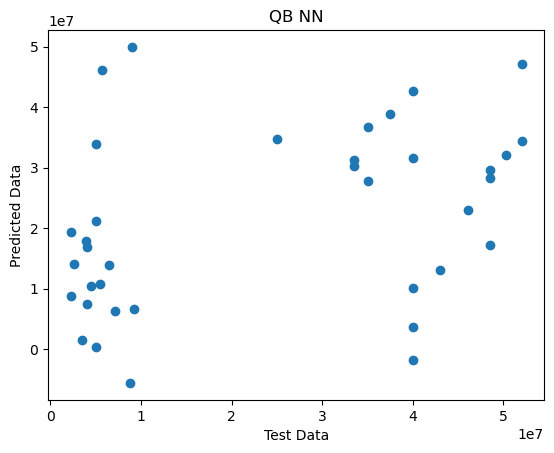

In [77]:
plt.cla()
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('QB NN')
plt.xlabel('Test Data')
plt.ylabel('Predicted Data')


Let's now train on how players perform before their contract.

In [78]:
passing_df[passing_df['year'] < passing_df['start_year']]
features = passing_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, passing_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [79]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [80]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

1/1 [==============================] - 0s 30ms/step
R^2 score: -0.13824409029708207


Text(0, 0.5, 'predicted data')

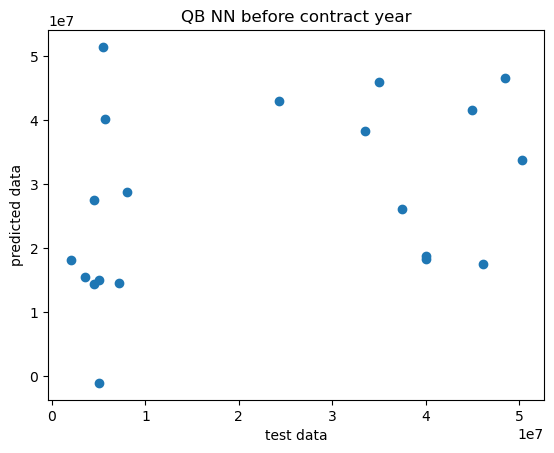

In [81]:
plt.cla()
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('QB NN before contract year')
plt.xlabel('test data')
plt.ylabel('predicted data')

In [82]:
passing_df[passing_df['year'] < passing_df['start_year']]
features = cluster_1_df[passing_df['dropbacks'] > 300][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [83]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [84]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

1/1 [==============================] - 0s 24ms/step
R^2 score: -0.6202368655656398


Text(0, 0.5, 'Predicted Data')

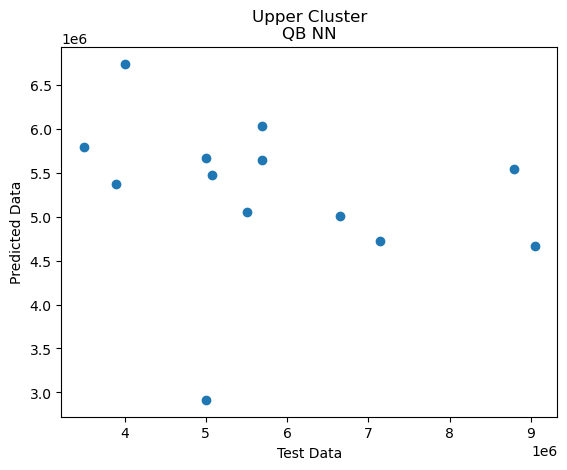

In [86]:
plt.cla()
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('Upper Cluster\nQB NN')
plt.xlabel('Test Data')
plt.ylabel('Predicted Data')

Now lets train on our upper cluster before they receive their contracts.

In [87]:
features = cluster_1_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [88]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [89]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score (test):', r2)

1/1 [==============================] - 0s 32ms/step
R^2 score (test): -2.6856783049148496


In [90]:
nn = model

Text(0, 0.5, 'Predicted Data')

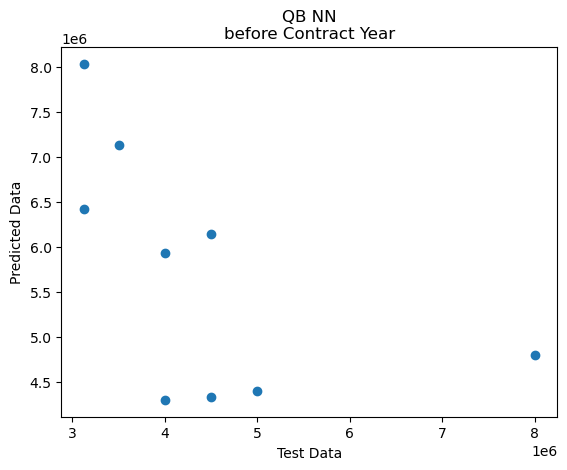

In [92]:
plt.cla()
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('QB NN\nbefore Contract Year')
plt.xlabel('Test Data')
plt.ylabel('Predicted Data')

Lets train on quarterbacks after they receive their contracts.

In [93]:
passing_df[passing_df['year'] < passing_df['start_year']]
features = passing_df[passing_df['start_year'] >= passing_df['year']][passing_df['dropbacks'] > 300][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, passing_df[passing_df['start_year'] >= passing_df['year']][passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [94]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [95]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

1/1 [==============================] - 0s 31ms/step
R^2 score: -0.07444004175034014


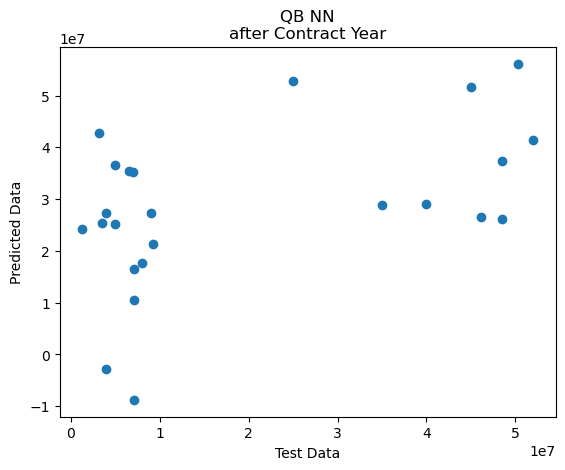

In [96]:
plt.plot(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred), 'o')
plt.title('QB NN\nafter Contract Year')
plt.xlabel('Test Data')
plt.ylabel('Predicted Data')
plt.show()

In [97]:
passing_df[passing_df['year'] < passing_df['start_year']]
features = cluster_1_df[passing_df['start_year'] <= passing_df['year']][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['start_year'] <= passing_df['year']][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [98]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [99]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

1/1 [==============================] - 0s 25ms/step
R^2 score: -2.0072316868516507


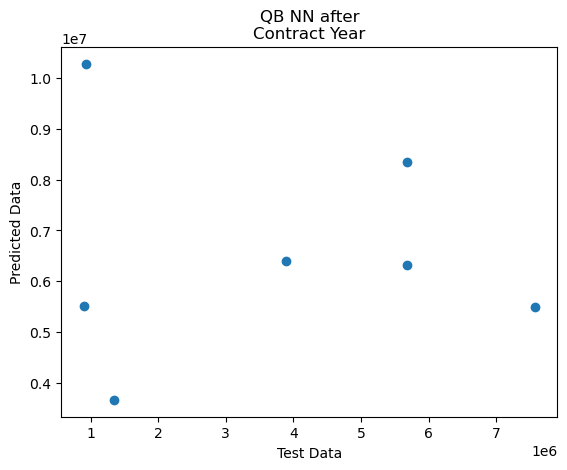

In [100]:
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('QB NN after\nContract Year')
plt.xlabel('Test Data')
plt.ylabel('Predicted Data')
plt.show()

There simply isn't enough data to make any conclusions from here. From our neural network we found that both our upper cluster and players before their contract offer more accurate training data. The most accurate we got was the model where we trained on the cluster of quarterbacks that received their second contracts and look at how they played before their contracts. This proved to be a fairly accurate model in terms of being able to predict salary on our testing data. Now lets try a couple of other machine learning models starting with K-nearest neighbors. This is a model which takes a new data point and looks at the points around it that are known and makes a prediction based off of them. Sklearn has a function that allows us to do this while specifying the amount of neighbors we want to observe.

In [101]:
from sklearn.neighbors import KNeighborsRegressor

features = passing_df[selected_feature_names]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, passing_df[['AAV']], test_size=0.2, random_state=42)

# Create KNN regressor
knn = KNeighborsRegressor(n_neighbors=20)

# Fit the model on the training data
knn.fit(X_train, y_train)

# Predict on the test data
y_pred = knn.predict(X_test)

# Evaluate the model
print("R^2 Score:", r2_score(y_test, y_pred))

R^2 Score: 0.18930600180429946


In [102]:
features = cluster_1_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][selected_feature_names]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)

# Create KNN regressor
knn = KNeighborsRegressor(n_neighbors=5)

# Fit the model on the training data
knn.fit(X_train, y_train)

# Predict on the test data
y_pred = knn.predict(X_test)

# Evaluate the model
print("R^2 Score:", r2_score(y_test, y_pred))

R^2 Score: -0.3351957028246346


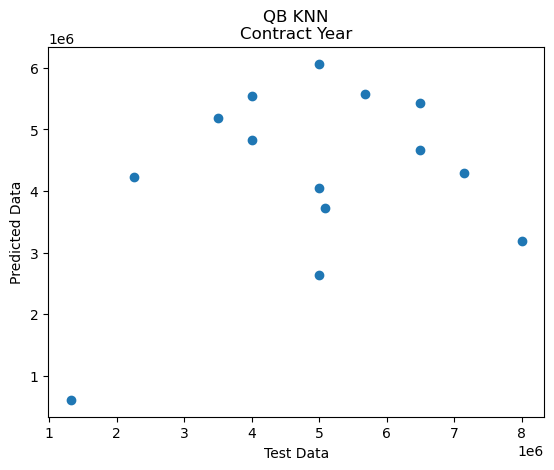

In [106]:
plt.plot(y_test, y_pred, 'o')
plt.title('QB KNN\nContract Year')
plt.xlabel('Test Data')
plt.ylabel('Predicted Data')
plt.show()

This is comparable to our neural net but still a pretty good model in terms of what we're looking for. Now let's try linear regression.

In [104]:
features = passing_df[selected_feature_names]
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, passing_df['AAV'], test_size=0.2, random_state=42)

# Create a linear regression model
lr = LinearRegression()

# Fit the model to the training data
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
print("R^2 Score:", r2_score(y_test, y_pred))

R^2 Score: 0.17032698915731814


In [105]:
features = cluster_1_df[passing_df['start_year'] > passing_df['year']][selected_feature_names]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['start_year'] > passing_df['year']][['AAV']], test_size=0.2, random_state=42)

# Create a linear regression model
lr = LinearRegression()

# Fit the model to the training data
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
print("R^2 Score:", r2_score(y_test, y_pred))

R^2 Score: -0.26449208379185873


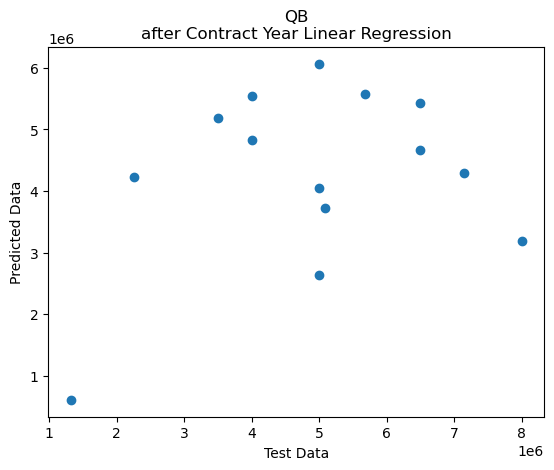

In [108]:
plt.plot(y_test, y_pred, 'o')
plt.title('QB\nafter Contract Year Linear Regression')
plt.xlabel('Test Data')
plt.ylabel('Predicted Data')
plt.show()

This is clearly not as good as our KNN or neural network. Now let's use our models to predict the average salary of the next two quarterbacks anticipated to get massive contracts, Joe Burrow and Justin Herbert.

In [109]:
justin_herbert = passing_df[passing_df['player'] == 'Justin Herbert']
justin_herbert

,player,player_id,position,team_name,player_game_count,accuracy_percent,aimed_passes,attempts,avg_depth_of_target,avg_time_to_throw,...,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year,Cluster
5,Justin Herbert,28237,QB,LAC,18,78.8,673,743,6.9,2.74,...,22,4,26578755,6644689,16890004,26578755,26578755,2020,2024,1
6,Justin Herbert,28237,QB,LAC,17,77.1,624,672,7.9,2.72,...,22,4,26578755,6644689,16890004,26578755,26578755,2020,2024,1
7,Justin Herbert,28237,QB,LAC,15,75.8,553,595,7.8,2.61,...,22,4,26578755,6644689,16890004,26578755,26578755,2020,2024,1


In [110]:
joe_burrow = passing_df[passing_df['player'] == 'Joe Burrow']
joe_burrow

,player,player_id,position,team_name,player_game_count,accuracy_percent,aimed_passes,attempts,avg_depth_of_target,avg_time_to_throw,...,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year,Cluster
8,Joe Burrow,28022,QB,CIN,19,77.3,660,715,7.6,2.50,...,23,4,36190137,9047534,23880100,36190137,36190137,2020,2024,1
9,Joe Burrow,28022,QB,CIN,20,79.8,619,662,8.2,2.62,...,23,4,36190137,9047534,23880100,36190137,36190137,2020,2024,1
10,Joe Burrow,28022,QB,CIN,10,73.5,381,404,8.9,2.60,...,23,4,36190137,9047534,23880100,36190137,36190137,2020,2024,1


In [111]:
print("Justin Herbert estimated contract:", max(knn.predict(justin_herbert[selected_feature_names]))[0])

Justin Herbert estimated contract: 5000000.0


In [112]:
print("Joe Burrow estimated contract:", max(knn.predict(joe_burrow[selected_feature_names]))[0])

Joe Burrow estimated contract: 5000000.0


Based on real life intuition, these predictions are a bit on the lower side, possibly due to not being able to account for inflation without limiting the dataset too much. After exploring and analyzing the NFL player stats data, we observed several interesting findings. We found that certain features like yards, completions and dropbacks were highly correlated and not needed in a predictive model. Additionally, we were able to use machine learning techniques such as neural networks and K-Nearest Neighbors to predict player performance based on their data. This project goes through the data science lifecycle. We started with data collection and processing, moving on to exploration to better understand the data and identify any issues or missing values. We went through feature selection, selecting and transforming relevant features to improve model performance. Next, we used various machine learning algorithms to build models and make predictions on player performance. Overall, this project demonstrates the importance of using exploratory data analysis and machine learning techniques to gain insights from complex data. It highlights the iterative nature of the data science lifecycle, where each step informs and improves the subsequent steps, ultimately leading to a better understanding of the data and better models. We also proved a hypothesis that based on certain data we can predict players contracts on a certain interval of confidence.